## Pendulum dynamical system
 
The visualization of the phase space, and trajectory of a pendulum with damping.

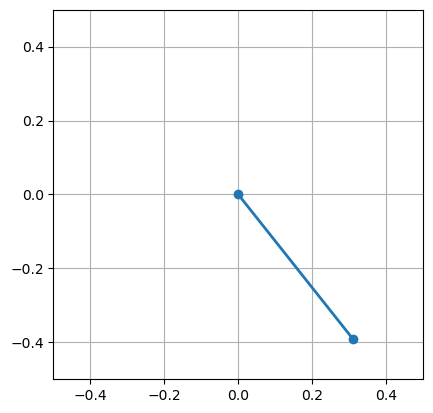

In [2]:
%matplotlib notebook
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
import matplotlib.animation as animation


# Parameters
L = 0.5  # Length of the pendulum
g = 9.81  # Acceleration due to gravity
damping = 0.1  # Damping coefficient
dt = 0.01  # Time step for numerical integration

# Initial conditions
theta0 = (8.99 * np.pi) / 9 # Initial angle (radians)
omega0 = 4.0  # Initial angular velocity

# Define the equation of motion for a damped pendulum
def damped_pendulum(state, t):
    theta, omega = state
    theta_dot = omega
    omega_dot = -(g / L) * np.sin(theta) - damping * omega
    return theta_dot, omega_dot

# Create a time array
t = np.arange(0, 5, dt)

# Numerically integrate the equations of motion
from scipy.integrate import odeint
initial_state = [theta0, omega0]
solution = odeint(damped_pendulum, initial_state, t)

# Extract the theta values from the solution
theta_values = solution[:, 0]

# Animation setup
fig, ax = plt.subplots()
ax.set_xlim(-L, L)
ax.set_ylim(-L, L)
ax.set_aspect('equal')
ax.grid()

line, = ax.plot([], [], 'o-', lw=2)

def animate(i):
    x = [0, L * np.sin(theta_values[i])]
    y = [0, -L * np.cos(theta_values[i])]
    line.set_data(x, y)
    return line,

ani = animation.FuncAnimation(fig, animate, len(t), interval=dt*1000, blit=True)
from IPython.display import HTML
HTML(ani.to_jshtml())

### Phase Space and Trajectory
Visualization of the phase space and the trajectory.

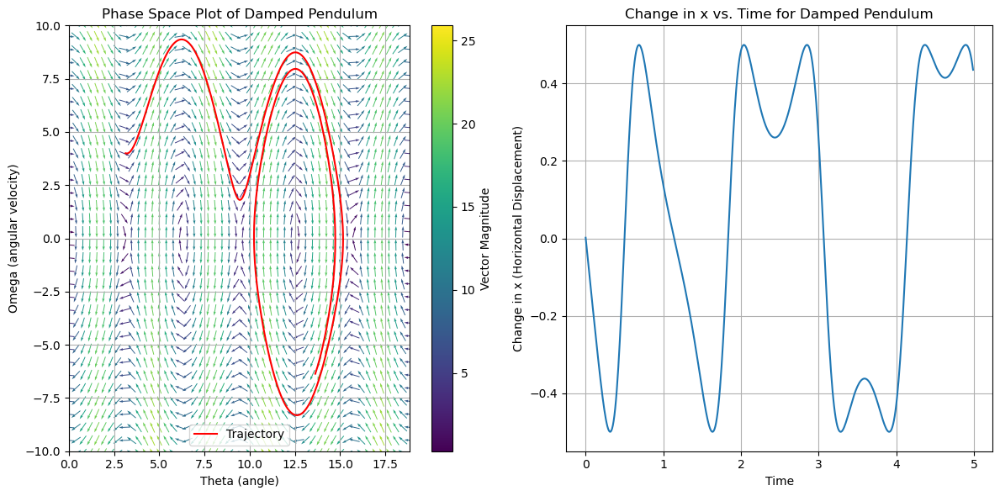

In [12]:
# Define the equations of motion for the damped pendulum
def damped_pendulum(theta, omega):
    theta_dot = omega
    omega_dot = -(g / L) * np.sin(theta) - damping * omega
    return theta_dot, omega_dot

# Initial conditions for the trajectory
theta_init = (8.99 * np.pi) / 9
omega_init = 4.0
t_end = 5.0

damping = 0.1  # Damping coefficient

# Numerical integration to generate the trajectory
trajectory = []
theta = theta_init
omega = omega_init
for t in np.arange(0, t_end, dt):
    trajectory.append((theta, omega))
    theta_dot, omega_dot = damped_pendulum(theta, omega)
    theta += theta_dot * dt
    omega += omega_dot * dt
    omega *= np.exp(-damping * dt)  # Apply damping effect

trajectory = np.array(trajectory)
x_displacement = L * np.sin(trajectory[:, 0])  # Horizontal displacement

# Initial conditions for the phase space plot
theta0 = np.linspace(0, 6*np.pi, 50)
omega0 = np.linspace(-15, 15, 50)

# Create a grid of initial conditions
Theta, Omega = np.meshgrid(theta0, omega0)

# Define the derivatives of theta and omega
theta_dot, omega_dot = damped_pendulum(Theta, Omega)

# Calculate the vector magnitudes
vector_magnitudes = np.sqrt(theta_dot**2 + omega_dot**2)

# Normalize the vectors
normalized_theta_dot = theta_dot / vector_magnitudes
normalized_omega_dot = omega_dot / vector_magnitudes

# Create a phase space plot with trajectory and vectors
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.quiver(
    Theta, Omega, normalized_theta_dot, normalized_omega_dot,
    vector_magnitudes, cmap='viridis', scale=30, pivot='middle'
)
plt.plot(trajectory[:, 0], trajectory[:, 1], color='red', label='Trajectory')
plt.xlabel('Theta (angle)')
plt.ylabel('Omega (angular velocity)')
plt.title('Phase Space Plot of Damped Pendulum')
plt.xlim(0, 6*np.pi)
plt.ylim(-10, 10)
plt.colorbar(label='Vector Magnitude')
plt.legend()
plt.grid()

# Plot change in x vs. time
plt.subplot(1, 2, 2)
plt.plot(np.arange(0, t_end, dt), x_displacement)
plt.xlabel('Time')
plt.ylabel('Change in x (Horizontal Displacement)')
plt.title('Change in x vs. Time for Damped Pendulum')
plt.grid()

plt.tight_layout()
plt.show()

### Comparing different solvers
Runge-Kutta versus Euler's method  

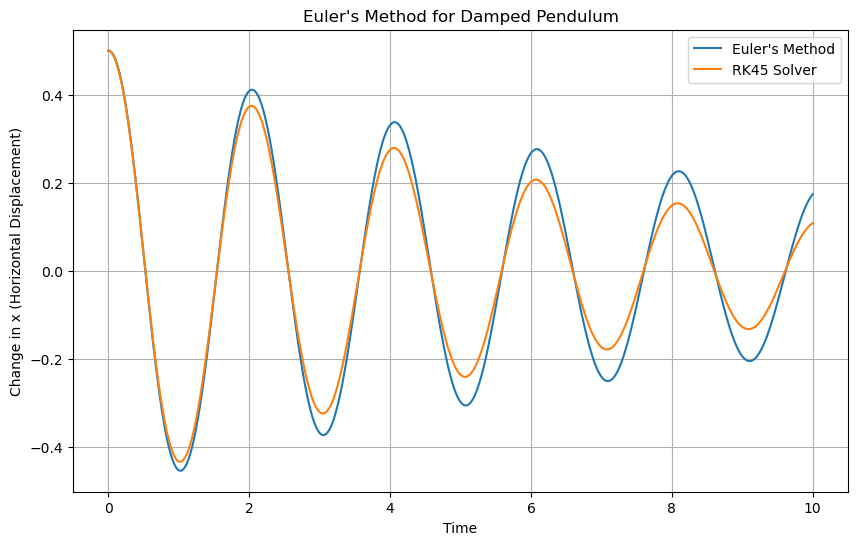

In [90]:
# Parameters
L = 1.0  # Length of the pendulum
g = 9.81  # Acceleration due to gravity
damping = 0.3  # Damping coefficient

# Initial conditions for the simulation
theta_init = np.radians(30)
omega_init = 0.0
initial_state = [theta_init, omega_init]

# Time span for simulation
t_start = 0
t_end = 10
dt = 0.01  # Time step

# Initialize arrays to store results
num_steps = int((t_end - t_start) / dt)
time_values = np.zeros(num_steps + 1)
theta_values = np.zeros(num_steps + 1)
omega_values = np.zeros(num_steps + 1)

# Set initial values
theta_values[0] = theta_init
omega_values[0] = omega_init

# Define the equations of motion for the damped pendulum
def damped_pendulum(theta, omega):
    theta_dot = omega
    omega_dot = -(g / L) * np.sin(theta) - damping * omega
    return theta_dot, omega_dot

# Euler's method
for i in range(num_steps):
    # h is the step size
    # y_n = y_n-1 + h * f(x_n-1, y_n-1)
    theta_dot, omega_dot = damped_pendulum(theta_values[i], omega_values[i])
    theta_values[i + 1] = theta_values[i] + theta_dot * dt
    omega_values[i + 1] = omega_values[i] + omega_dot * dt
    time_values[i + 1] = time_values[i] + dt

def damped_pendulum(t, state):
    theta, omega = state
    theta_dot = omega
    omega_dot = -(g / L) * np.sin(theta) - damping * omega
    return [theta_dot, omega_dot]
    
# Runge-Kutta
sol_rk45 = solve_ivp(damped_pendulum, (t_start, t_end), initial_state, method='RK45', t_eval=np.linspace(t_start, t_end, num_steps))

# Calculate horizontal displacement
x_displacement = L * np.sin(theta_values)
x_displacement_rk45 = L * np.sin(sol_rk45.y[0])

# Create a plot for Euler's method
plt.figure(figsize=(10, 6))
plt.plot(time_values, x_displacement, label='Euler\'s Method')

plt.plot(sol_rk45.t, x_displacement_rk45, label='RK45 Solver')
plt.xlabel('Time')
plt.ylabel('Change in x (Horizontal Displacement)')
plt.title('Euler\'s Method for Damped Pendulum')
plt.legend()
plt.grid()
plt.show()

### Double Pendulum
Unstable attempt at the double pendulum

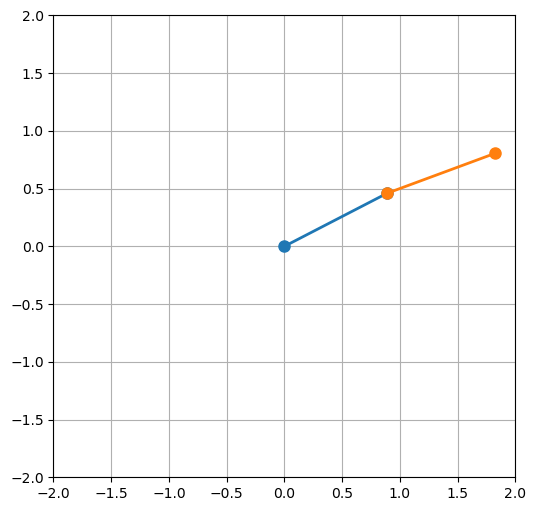

In [23]:
# Parameters
L1 = 1.0  # Length of the first pendulum arm
L2 = 1.0  # Length of the second pendulum arm
m1 = 1.0  # Mass of the first pendulum bob
m2 = 1.0  # Mass of the second pendulum bob
g = 9.81  # Acceleration due to gravity

# Define the equations of motion for the double pendulum
def double_pendulum(t, state):
    theta1, omega1, theta2, omega2 = state

    c1 = np.cos(theta1)
    c2 = np.cos(theta2)
    s1 = np.sin(theta1)
    s2 = np.sin(theta2)

    denominator1 = (m1 + m2) * L1 - m2 * L1 * c1 * c1
    denominator2 = (L2 / L1) * denominator1

    theta1_dot = omega1
    omega1_dot = (m2 * g * s2 * c1 - m2 * L2 * omega2 * omega2 * s2 - (m1 + m2) * g * s1) / denominator1
    theta2_dot = omega2
    omega2_dot = ((L1 / L2) * m2 * g * s1 * c2 + (L1 / L2) * m2 * L1 * omega1 * omega1 * s1 - (L1 / L2) * (m1 + m2) * g * s2) / denominator2

    return [theta1_dot, omega1_dot, theta2_dot, omega2_dot]

# Initial conditions for the double pendulum
theta1_init = np.pi + 0.001
omega1_init = 0.0
theta2_init = np.pi
omega2_init = 0.0
initial_state = [theta1_init, omega1_init, theta2_init, omega2_init]

# Time span for simulation
t_span = (0, 10)  # Start and end times for integration

# Solve the ODE using numerical integration
solution = solve_ivp(double_pendulum, t_span, initial_state, t_eval=np.linspace(t_span[0], t_span[1], 1000))

# Create a figure and axis for animation
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(autoscale_on=False, xlim=(-2, 2), ylim=(-2, 2))
ax.set_aspect('equal')
ax.grid()

line1, = ax.plot([], [], 'o-', lw=2, markersize=8, label='Pendulum 1')
line2, = ax.plot([], [], 'o-', lw=2, markersize=8, label='Pendulum 2')

def animate(i):
    x1 = L1 * np.sin(solution.y[0, i])
    y1 = -L1 * np.cos(solution.y[0, i])
    x2 = x1 + L2 * np.sin(solution.y[2, i])
    y2 = y1 - L2 * np.cos(solution.y[2, i])

    line1.set_data([0, x1], [0, y1])
    line2.set_data([x1, x2], [y1, y2])
    
    return line1, line2

ani = animation.FuncAnimation(fig, animate, range(len(solution.t)), interval=30, blit=True)

from IPython.display import HTML
HTML(ani.to_jshtml())